In [7]:
from keras import backend as K
from keras.models import load_model
from keras.optimizers import Adam
from imageio import imread
import numpy as np
from matplotlib import pyplot as plt
import keras.utils as image
from models.keras_ssd300 import ssd_300
from keras_loss_function.keras_ssd_loss import SSDLoss
from keras_layers.keras_layer_AnchorBoxes import AnchorBoxes
from keras_layers.keras_layer_DecodeDetections import DecodeDetections
from keras_layers.keras_layer_DecodeDetectionsFast import DecodeDetectionsFast
from keras_layers.keras_layer_L2Normalization import L2Normalization

from ssd_encoder_decoder.ssd_output_decoder import decode_detections, decode_detections_fast

from data_generator.object_detection_2d_data_generator import DataGenerator
from data_generator.object_detection_2d_photometric_ops import ConvertTo3Channels
from data_generator.object_detection_2d_geometric_ops import Resize
from data_generator.object_detection_2d_misc_utils import apply_inverse_transforms

%matplotlib inline

In [2]:

img_height = 300
img_width = 300

In [38]:


K.clear_session()

model = ssd_300(image_size=(img_height, img_width, 3),
                n_classes=20,
                mode='inference',
                l2_regularization=0.0005,
                scales=[0.1, 0.2, 0.37, 0.54, 0.71, 0.88, 1.05],
                aspect_ratios_per_layer=[[1.0, 2.0, 0.5],
                                         [1.0, 2.0, 0.5, 3.0, 1.0/3.0],
                                         [1.0, 2.0, 0.5, 3.0, 1.0/3.0],
                                         [1.0, 2.0, 0.5, 3.0, 1.0/3.0],
                                         [1.0, 2.0, 0.5],
                                         [1.0, 2.0, 0.5]],
                two_boxes_for_ar1=True,
                steps=[8, 16, 32, 64, 100, 300],
                offsets=[0.5, 0.5, 0.5, 0.5, 0.5, 0.5],
                clip_boxes=False,
                variances=[0.1, 0.1, 0.2, 0.2],
                normalize_coords=True,
                subtract_mean=[123, 117, 104],
                swap_channels=[2, 1, 0],
                confidence_thresh=0.5,
                iou_threshold=0.45,
                top_k=200,
                nms_max_output_size=400)


weights_path = 'VGG_VOC0712_SSD_300x300_iter_120000.h5'

model.load_weights(weights_path, by_name=True)


adam = Adam(lr=0.001, beta_1=0.9, beta_2=0.999, epsilon=1e-08, decay=0.0)

ssd_loss = SSDLoss(neg_pos_ratio=3, alpha=1.0)

model.compile(optimizer=adam, loss=ssd_loss.compute_loss)

C:\Study\8_term\Comp_vision\L1\venv\lib\site-packages\keras\optimizers\optimizer_v2\adam.py:117: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super().__init__(name, **kwargs)


In [5]:

model_path = 'ssd300_pascal_07+12_epoch-01_loss-14.5838_val_loss-12.9368.h5'

ssd_loss = SSDLoss(neg_pos_ratio=3, n_neg_min=0, alpha=1.0)

K.clear_session()

model = load_model(model_path, custom_objects={'AnchorBoxes': AnchorBoxes,
                                               'L2Normalization': L2Normalization,
                                               'DecodeDetections': DecodeDetections,
                                               'compute_loss': ssd_loss.compute_loss})

In [39]:
orig_images = []
input_images = []

img_path = 'examples/fish_bike.jpg'

orig_images.append(imread(img_path))
img = image.load_img(img_path, target_size=(img_height, img_width))
img = image.img_to_array(img) 
input_images.append(img)
input_images = np.array(input_images)

C:\Study\8_term\Comp_vision\L1\venv\lib\site-packages\ipykernel_launcher.py:7: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  import sys


In [40]:
y_pred = model.predict(input_images)

1/1 [==============================] - 1s 1s/step


In [42]:
confidence_threshold = 0.5

y_pred_thresh = [y_pred[k][y_pred[k,:,1] >= confidence_threshold] for k in range(y_pred.shape[0])]

np.set_printoptions(precision=2, suppress=True, linewidth=90)
print("Predicted boxes:\n")
print('   class     conf    xmin   ymin   xmax   ymax')
print(y_pred_thresh[0])

Predicted boxes:

   class     conf    xmin   ymin   xmax   ymax
[[ 15.     1.   128.08   3.63 214.02 156.63]
 [  2.     0.65  22.75  72.37 282.14 283.57]]


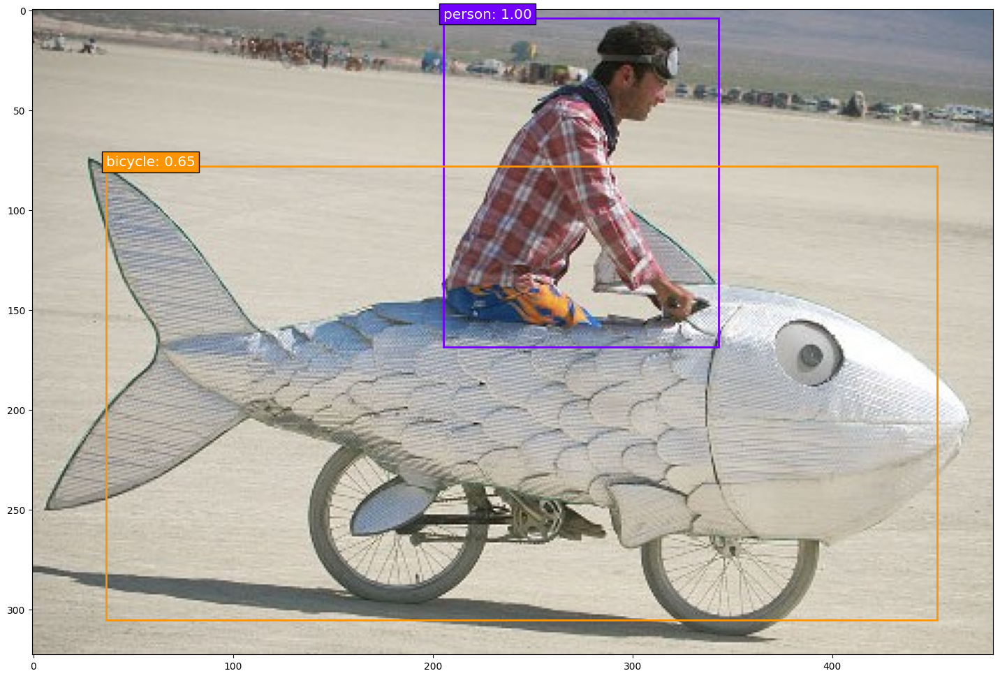

In [43]:
colors = plt.cm.hsv(np.linspace(0, 1, 21)).tolist()
classes = ['background',
           'aeroplane', 'bicycle', 'bird', 'boat',
           'bottle', 'bus', 'car', 'cat',
           'chair', 'cow', 'diningtable', 'dog',
           'horse', 'motorbike', 'person', 'pottedplant',
           'sheep', 'sofa', 'train', 'tvmonitor']

plt.figure(figsize=(20,12))
plt.imshow(orig_images[0])

current_axis = plt.gca()

for box in y_pred_thresh[0]:
    # Transform the predicted bounding boxes for the 300x300 image to the original image dimensions.
    xmin = box[2] * orig_images[0].shape[1] / img_width
    ymin = box[3] * orig_images[0].shape[0] / img_height
    xmax = box[4] * orig_images[0].shape[1] / img_width
    ymax = box[5] * orig_images[0].shape[0] / img_height
    color = colors[int(box[0])]
    label = '{}: {:.2f}'.format(classes[int(box[0])], box[1])
    current_axis.add_patch(plt.Rectangle((xmin, ymin), xmax-xmin, ymax-ymin, color=color, fill=False, linewidth=2))  
    current_axis.text(xmin, ymin, label, size='x-large', color='white', bbox={'facecolor':color, 'alpha':1.0})

In [44]:


dataset = DataGenerator()


VOC_2007_images_dir         = 'VOCdevkit/test/VOC2007/JPEGImages/'
VOC_2007_annotations_dir    = 'VOCdevkit/test/VOC2007/Annotations/'
VOC_2007_test_image_set_filename = 'VOCdevkit/test/VOC2007/ImageSets/Main/test.txt'

classes = ['background',
           'aeroplane', 'bicycle', 'bird', 'boat',
           'bottle', 'bus', 'car', 'cat',
           'chair', 'cow', 'diningtable', 'dog',
           'horse', 'motorbike', 'person', 'pottedplant',
           'sheep', 'sofa', 'train', 'tvmonitor']

dataset.parse_xml(images_dirs=[VOC_2007_images_dir],
                  image_set_filenames=[VOC_2007_test_image_set_filename],
                  annotations_dirs=[VOC_2007_annotations_dir],
                  classes=classes,
                  include_classes='all',
                  exclude_truncated=False,
                  exclude_difficult=True,
                  ret=False)

convert_to_3_channels = ConvertTo3Channels()
resize = Resize(height=img_height, width=img_width)

generator = dataset.generate(batch_size=1,
                             shuffle=True,
                             transformations=[convert_to_3_channels,
                                              resize],
                             returns={'processed_images',
                                      'filenames',
                                      'inverse_transform',
                                      'original_images',
                                      'original_labels'},
                             keep_images_without_gt=False)

Processing image set 'test.txt': 100%|██████████| 4952/4952 [00:09<00:00, 507.26it/s]


Image: VOCdevkit/test/VOC2007/JPEGImages/005066.jpg

Ground truth boxes:

[[  6 102  57 401 347]]
1/1 [==============================] - 0s 213ms/step
Predicted boxes:

   class   conf xmin   ymin   xmax   ymax
[[  6.   1.  89.  60. 403. 353.]]
Image: VOCdevkit/test/VOC2007/JPEGImages/004406.jpg

Ground truth boxes:

[[  3 124  75 500 225]]
1/1 [==============================] - 0s 213ms/step
Predicted boxes:

   class   conf xmin   ymin   xmax   ymax
[[  3.     0.99 120.    78.   456.   275.  ]]
Image: VOCdevkit/test/VOC2007/JPEGImages/008073.jpg

Ground truth boxes:

[[ 11 194 221 470 375]
 [  9 162 209 264 364]
 [  9 181 231 292 374]
 [  9 291 273 437 375]
 [ 15  82  56 161 348]]
1/1 [==============================] - 0s 198ms/step
Predicted boxes:

   class   conf xmin   ymin   xmax   ymax
[[  9.     1.   300.   273.   433.   373.  ]
 [ 11.     0.99 193.   220.   413.   367.  ]
 [ 15.     0.94  87.    47.   153.   327.  ]
 [  9.     0.54 168.   221.   229.   360.  ]
 [  9.     0.52

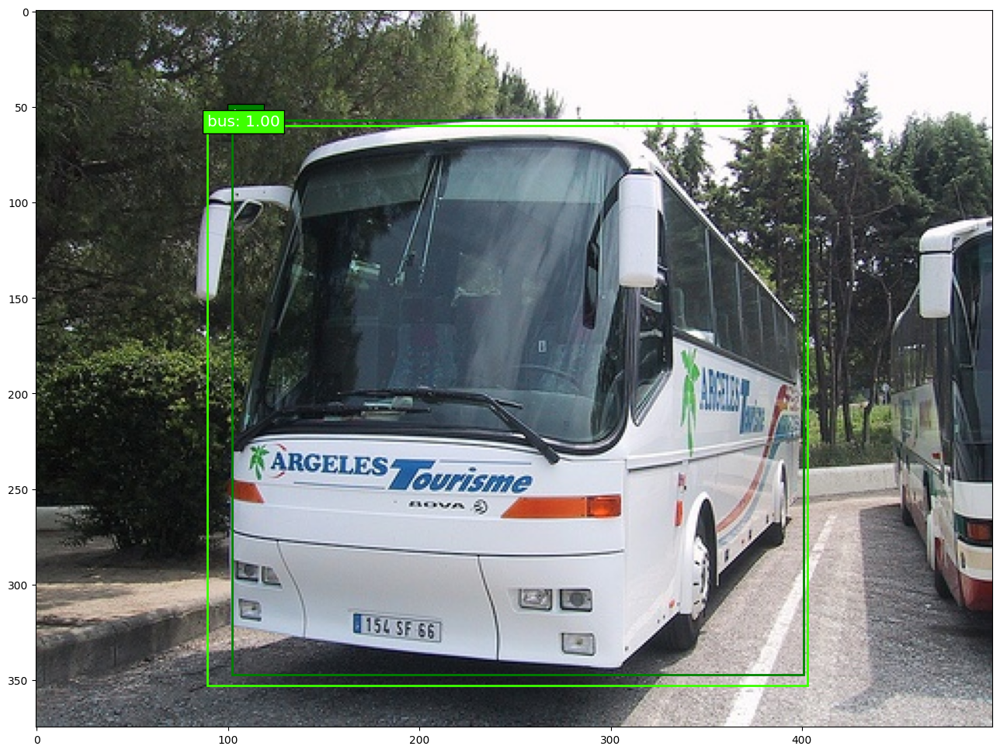

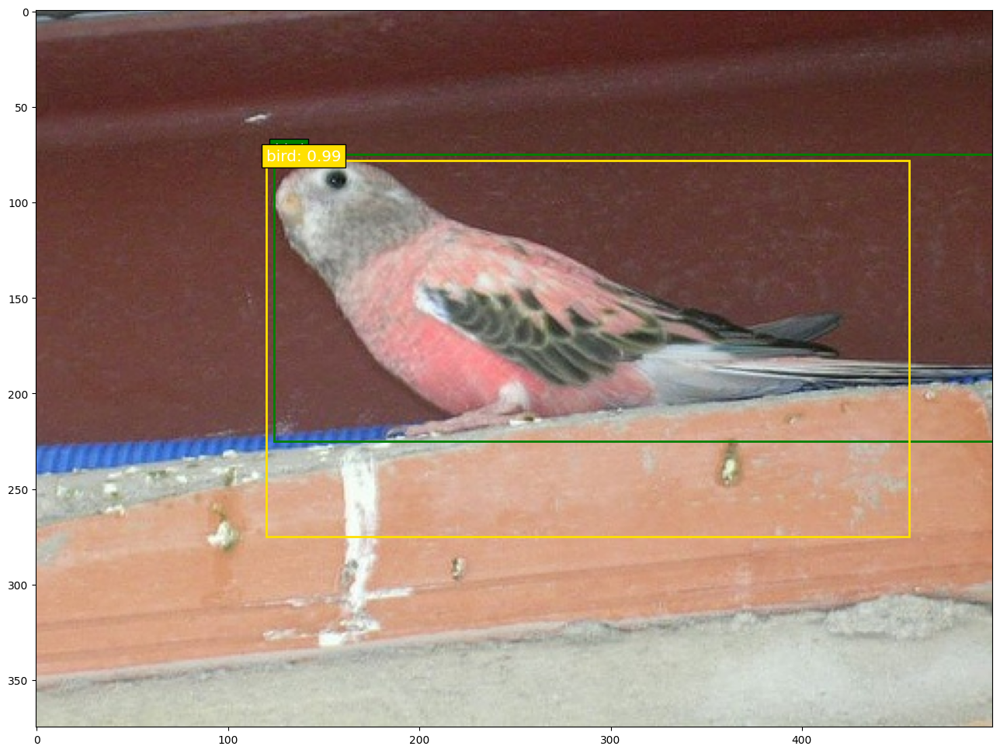

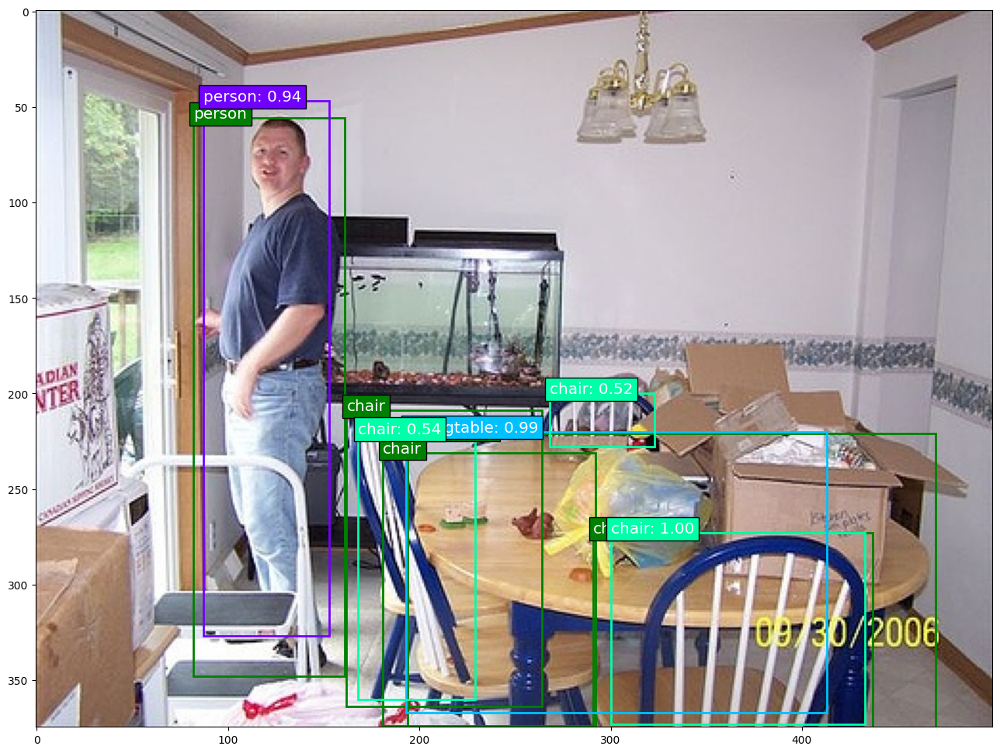

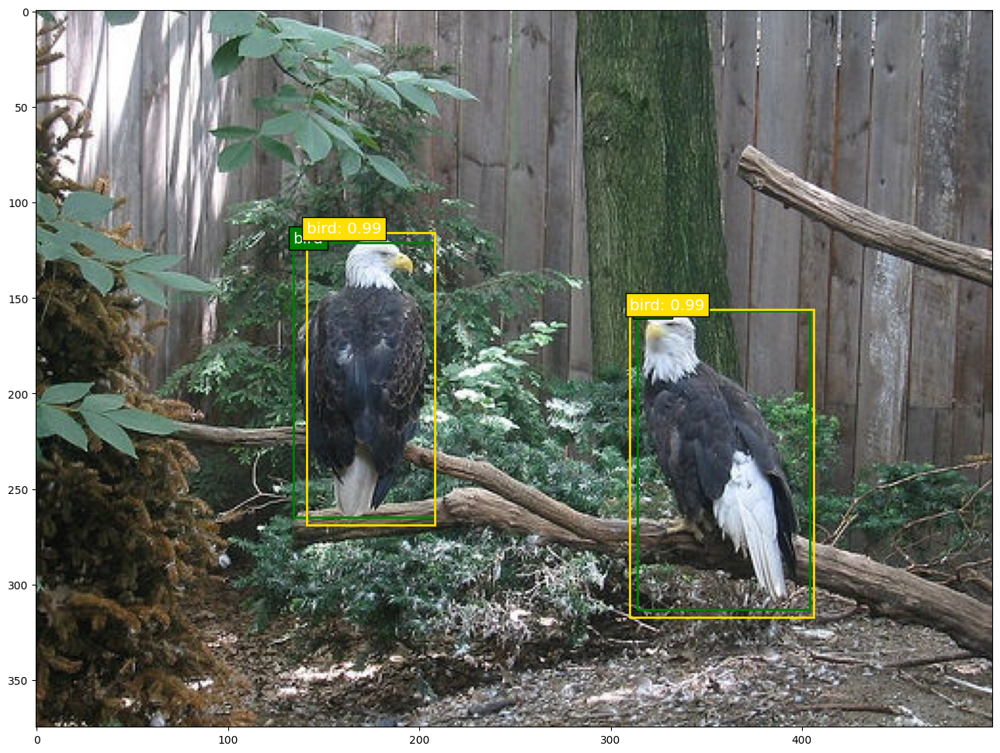

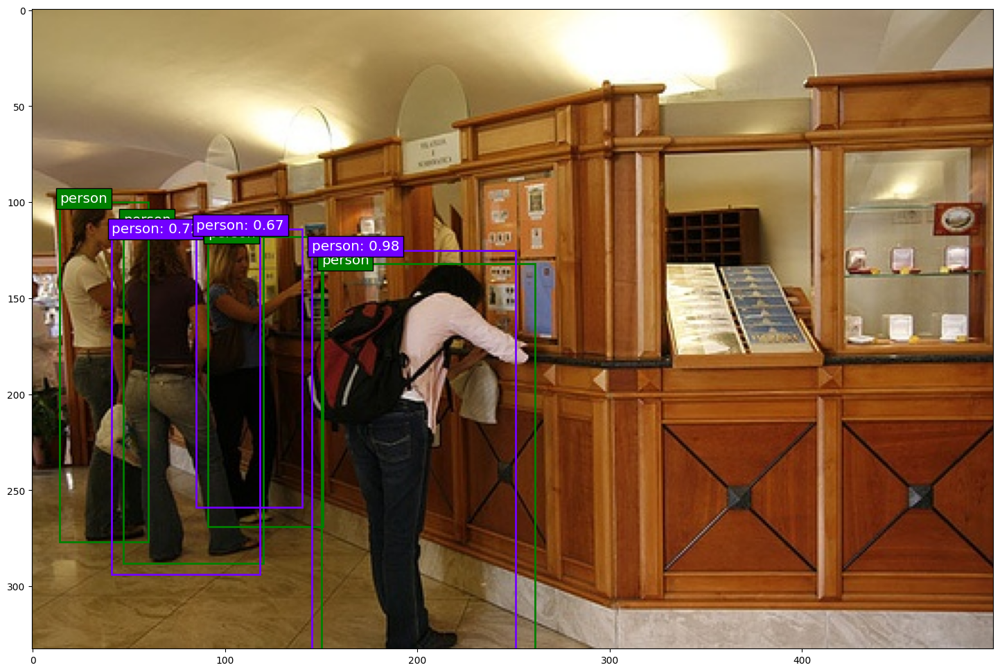

In [59]:

for counter in range(0,5):
    batch_images, batch_filenames, batch_inverse_transforms, batch_original_images, batch_original_labels = next(generator)

    i = 0

    print("Image:", batch_filenames[i])
    print()
    print("Ground truth boxes:\n")
    print(np.array(batch_original_labels[i]))
    y_pred = model.predict(batch_images)
    confidence_threshold = 0.5


    y_pred_thresh = [y_pred[k][y_pred[k,:,1] > confidence_threshold] for k in range(y_pred.shape[0])]


    y_pred_thresh_inv = apply_inverse_transforms(y_pred_thresh, batch_inverse_transforms)

    np.set_printoptions(precision=2, suppress=True, linewidth=90)
    print("Predicted boxes:\n")
    print('   class   conf xmin   ymin   xmax   ymax')
    print(y_pred_thresh_inv[i])



    colors = plt.cm.hsv(np.linspace(0, 1, 21)).tolist()

    plt.figure(figsize=(20,12))
    plt.imshow(batch_original_images[i])

    current_axis = plt.gca()


    for box in batch_original_labels[i]:
        xmin = box[1]
        ymin = box[2]
        xmax = box[3]
        ymax = box[4]
        label = '{}'.format(classes[int(box[0])])
        current_axis.add_patch(plt.Rectangle((xmin, ymin), xmax-xmin, ymax-ymin, color='green', fill=False, linewidth=2))
        current_axis.text(xmin, ymin, label, size='x-large', color='white', bbox={'facecolor':'green', 'alpha':1.0})

    for box in y_pred_thresh_inv[i]:
        xmin = box[2]
        ymin = box[3]
        xmax = box[4]
        ymax = box[5]
        color = colors[int(box[0])]
        label = '{}: {:.2f}'.format(classes[int(box[0])], box[1])
        current_axis.add_patch(plt.Rectangle((xmin, ymin), xmax-xmin, ymax-ymin, color=color, fill=False, linewidth=2))
        current_axis.text(xmin, ymin, label, size='x-large', color='white', bbox={'facecolor':color, 'alpha':1.0})

Image: VOCdevkit/test/VOC2007/JPEGImages/001813.jpg

Ground truth boxes:

[[ 20 458 181 500 287]]
1/1 [==============================] - 0s 202ms/step
Predicted boxes:

   class   conf xmin   ymin   xmax   ymax
[[ 20.     0.51 452.   177.   504.   280.  ]]
Image: VOCdevkit/test/VOC2007/JPEGImages/007367.jpg

Ground truth boxes:

[[  6 133 184 274 234]]
1/1 [==============================] - 0s 182ms/step
Predicted boxes:

   class   conf xmin   ymin   xmax   ymax
[[  6.     0.61 126.   189.   276.   237.  ]]
Image: VOCdevkit/test/VOC2007/JPEGImages/009137.jpg

Ground truth boxes:

[[  4 213 147 266 169]]
1/1 [==============================] - 0s 192ms/step
Predicted boxes:

   class   conf xmin   ymin   xmax   ymax
[[  4.     0.74 211.   133.   285.   170.  ]
 [  4.     0.69  48.   143.   116.   171.  ]
 [  4.     0.54  87.   134.   155.   165.  ]]
Image: VOCdevkit/test/VOC2007/JPEGImages/001141.jpg

Ground truth boxes:

[[  4 355  85 404 110]
 [  4 261 172 412 368]
 [ 15 217 118 242 2

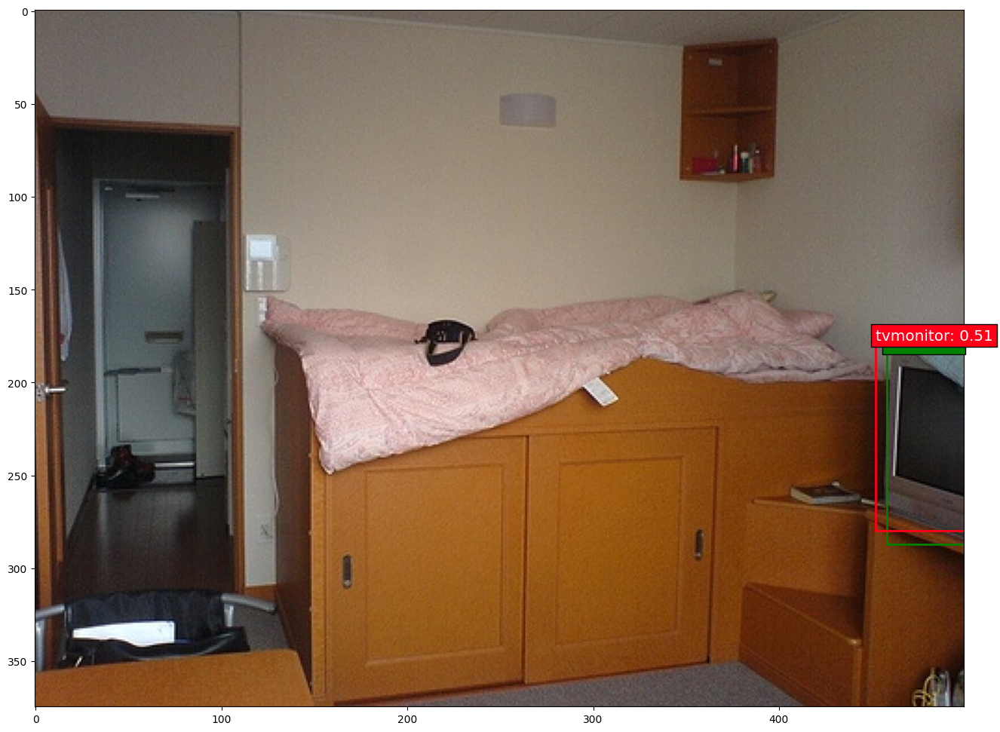

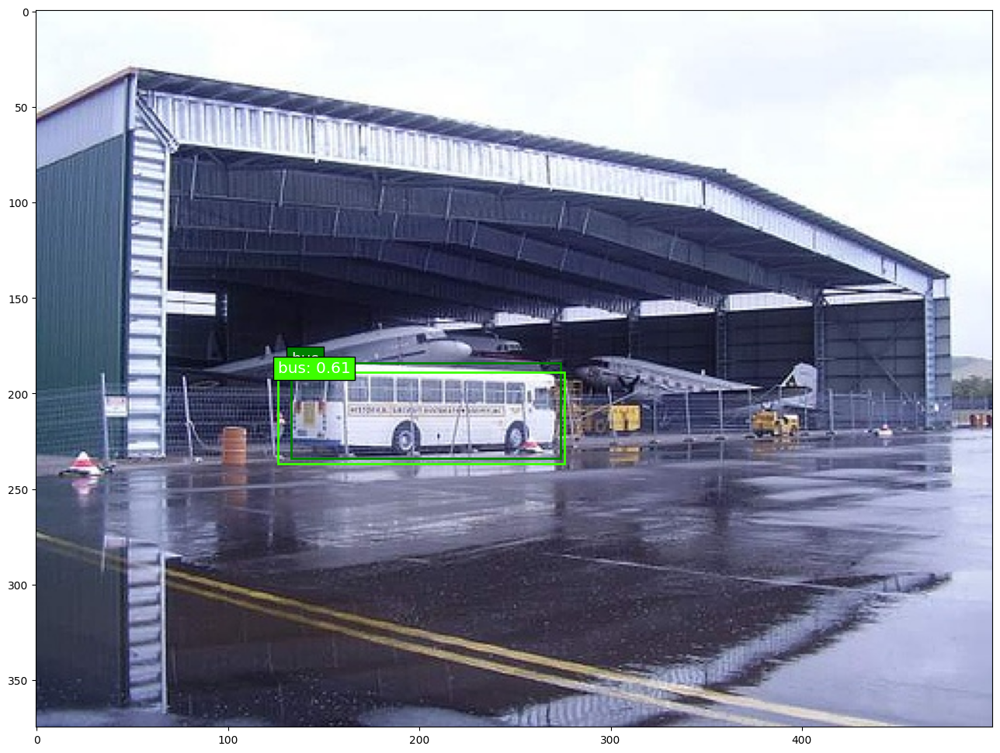

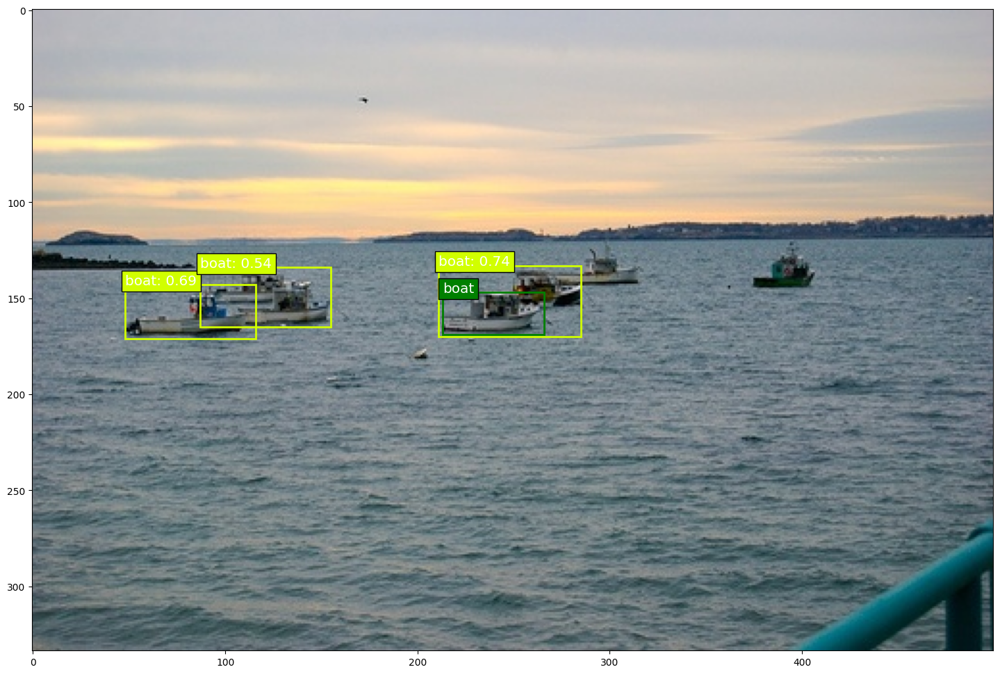

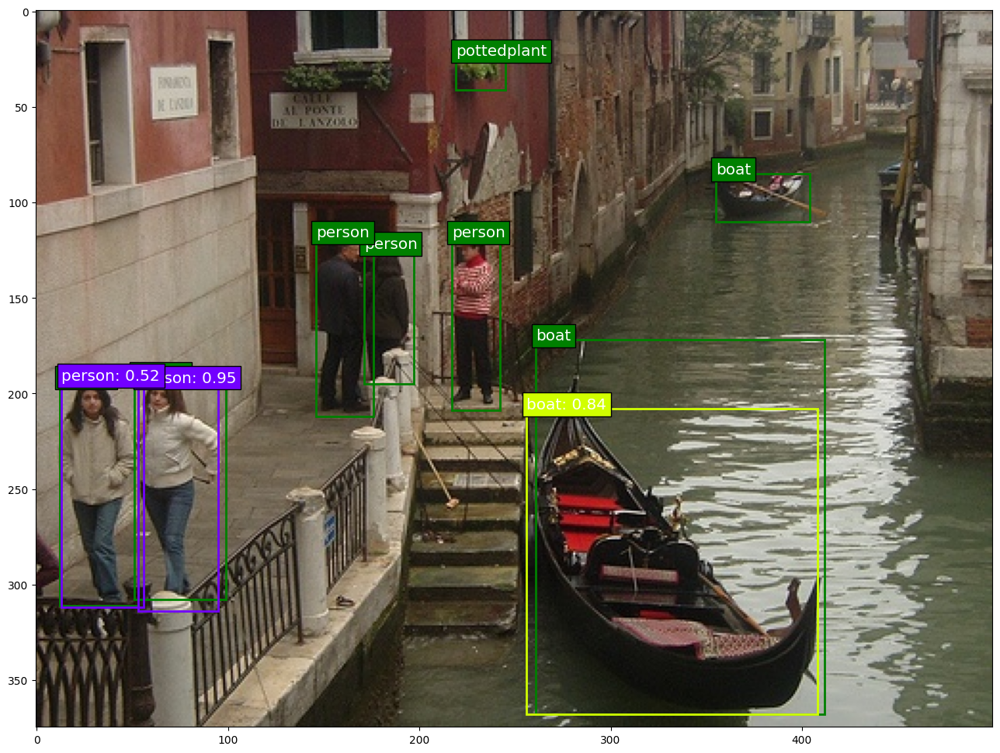

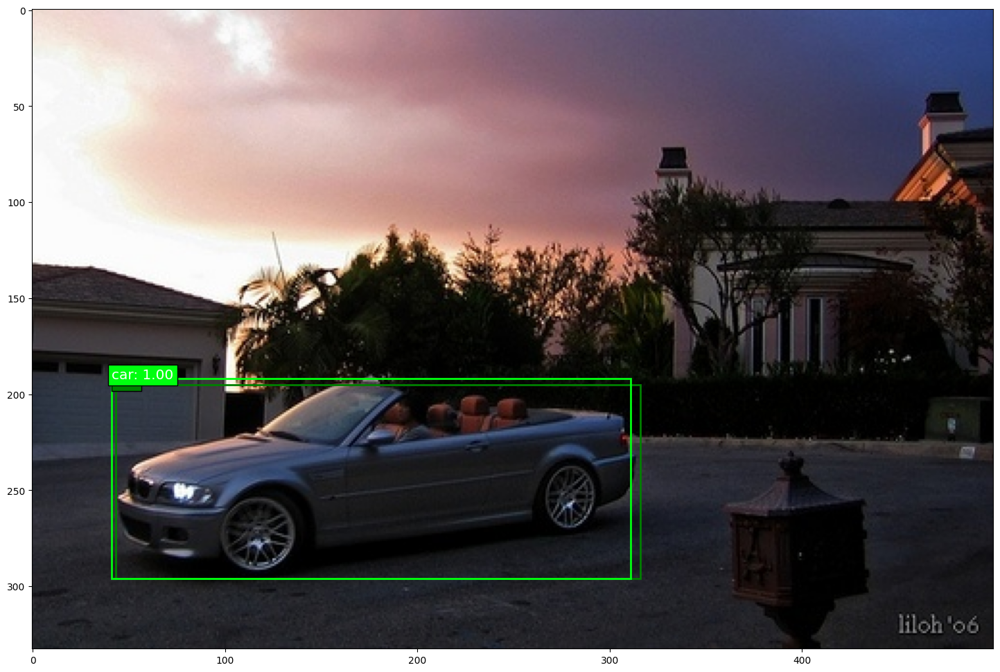

In [60]:

for counter in range(0,5):
    batch_images, batch_filenames, batch_inverse_transforms, batch_original_images, batch_original_labels = next(generator)

    i = 0

    print("Image:", batch_filenames[i])
    print()
    print("Ground truth boxes:\n")
    print(np.array(batch_original_labels[i]))
    y_pred = model.predict(batch_images)
    confidence_threshold = 0.5


    y_pred_thresh = [y_pred[k][y_pred[k,:,1] > confidence_threshold] for k in range(y_pred.shape[0])]


    y_pred_thresh_inv = apply_inverse_transforms(y_pred_thresh, batch_inverse_transforms)

    np.set_printoptions(precision=2, suppress=True, linewidth=90)
    print("Predicted boxes:\n")
    print('   class   conf xmin   ymin   xmax   ymax')
    print(y_pred_thresh_inv[i])

    colors = plt.cm.hsv(np.linspace(0, 1, 21)).tolist()

    plt.figure(figsize=(20,12))
    plt.imshow(batch_original_images[i])

    current_axis = plt.gca()


    for box in batch_original_labels[i]:
        xmin = box[1]
        ymin = box[2]
        xmax = box[3]
        ymax = box[4]
        label = '{}'.format(classes[int(box[0])])
        current_axis.add_patch(plt.Rectangle((xmin, ymin), xmax-xmin, ymax-ymin, color='green', fill=False, linewidth=2))
        current_axis.text(xmin, ymin, label, size='x-large', color='white', bbox={'facecolor':'green', 'alpha':1.0})

    for box in y_pred_thresh_inv[i]:
        xmin = box[2]
        ymin = box[3]
        xmax = box[4]
        ymax = box[5]
        color = colors[int(box[0])]
        label = '{}: {:.2f}'.format(classes[int(box[0])], box[1])
        current_axis.add_patch(plt.Rectangle((xmin, ymin), xmax-xmin, ymax-ymin, color=color, fill=False, linewidth=2))
        current_axis.text(xmin, ymin, label, size='x-large', color='white', bbox={'facecolor':color, 'alpha':1.0})